<h2 style="text-align:center;" > Estudio de viabilidad en la delimitación de coberturas con imágenes satelitales mediante el modelo Segment Anything: Comparación con la metodología CORINE Land Cover en el municipio de Guatavita.</h2>

<h2 style="text-align:center;" >Tutorial generacion de teselas</h2>

Autores:
*   **Cristian Stiven Florez Macias**
*   **Sergio Andres Escobar Eslava** 

##  Indice
1. [INSTALACIÓN DE PAQUETES](#packages)
2. [IMPORTAR PAQUETES](#import)
3. [GENERACION DE TESELAS](#auth)
4. [RECORTAR IMAGEN](#area)
4. [RECORTAR COBERTURA](#area)


<a name="packages"></a>

## 1. INSTALACIÓN DE PAQUETES

In [37]:
!pip install -q tqdm pandas numpy geopandas rasterio

## 2. IMPORTAR PAQUETES

In [ ]:
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import geopandas as gpd
import rasterio as rio
from rasterio import mask
import os

## 3. GENERAR TESELAS

Se genera primero una malla la cual va a contener la informacion georeferenciada de la zona de estudio

In [13]:
def generate_tiles(image_file, output_file, area_str, size=64):
    """Genera teselas poligonales de 64 x 64.

    Args:
      image_file (str): Ruta del archivo de imagen (.tif)
      output_file (str): Ruta del archivo de salida (.geojson)
      area_str (str): Nombre de la región
      size (int): Tamaño de la ventana

    Returns:
      GeoPandas DataFrame: Contiene las teselas poligonales de 64 x 64
    """

    # Abre la imagen ráster usando rasterio
    raster = rio.open(image_file)
    width, height = raster.shape

    # Crea un diccionario que contendrá nuestras teselas poligonales de 64 x 64 px
    # Más tarde convertiremos este diccionario en un DataFrame de GeoPandas.
    geo_dict = {'id': [], 'geometry': []}
    index = 0

    # Realiza un desplazamiento de ventana deslizante sobre la imagen ráster
    with tqdm(total=width * height) as pbar:
        for w in range(0, width, size):
            for h in range(0, height, size):
                # Crea una ventana del tamaño deseado
                window = rio.windows.Window(h, w, size, size)
                # Obtén los límites georreferenciados de la ventana
                bbox = rio.windows.bounds(window, raster.transform)
                # Crea una geometría de shapely a partir del cuadro delimitador
                bbox = box(*bbox)

                # Crea un identificador único para cada geometría
                uid = '{}-{}'.format(area_str.lower().replace(' ', '_'), index)

                # Actualiza el diccionario
                geo_dict['id'].append(uid)
                geo_dict['geometry'].append(bbox)

                index += 1
                pbar.update(size * size)

    # Convierte el diccionario en un DataFrame de GeoPandas
    results = gpd.GeoDataFrame(pd.DataFrame(geo_dict))
    # Establece el CRS a EPSG:4326
    results.crs = {'init': 'epsg:4326'}
    # Guarda el archivo como GeoJSON
    results.to_file(output_file, driver="GeoJSON")

    raster.close()
    return results

In [35]:
tif_file='../tiff/sentinel_guatavita_realzada.tif'
output_file = os.path.join("../tiles", '{}.geojson'.format('gautavita'))
tiles = generate_tiles(tif_file, output_file, 'gautavita', size=256)

  0%|          | 0/4589795 [00:00<?, ?it/s]

c:\Users\Cristian\Desktop\Trabajos U\DEFINITIVO-Proyecto de grado\.venv\Lib\site-packages\pyproj\crs\crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


C:\Users\Cristian\AppData\Local\Temp\ipykernel_49360\3956278743.py:5: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  tiles = gpd.sjoin(tiles, boundary, predicate='within')


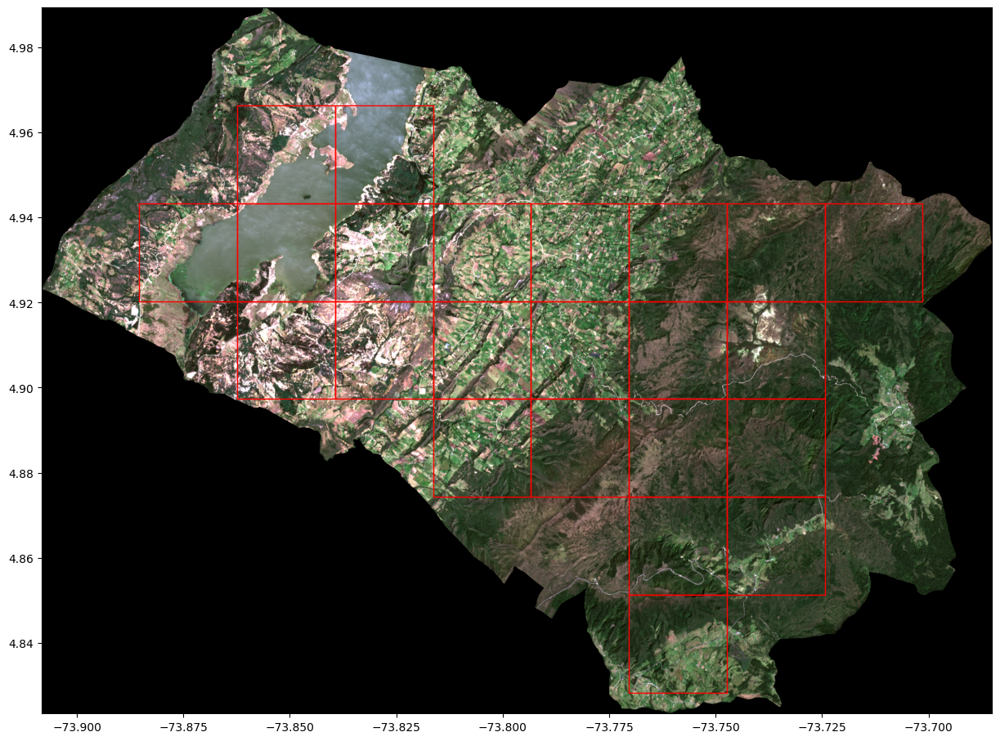

In [36]:
image = rio.open(tif_file)
boundary = gpd.read_file('../geojson/guatavita.geojson')

# Geopandas funcion sjoin
tiles = gpd.sjoin(tiles, boundary, predicate='within')

fig, ax = plt.subplots(figsize=(15,15))
tiles.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

## Recorte de la imagen satelital

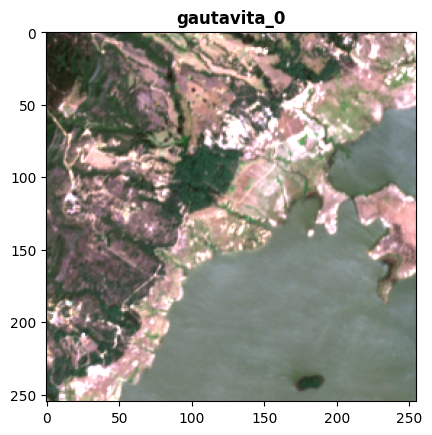

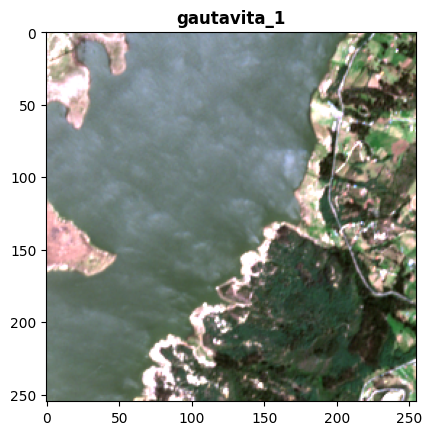

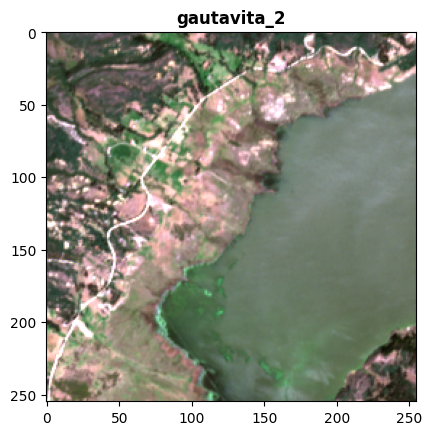

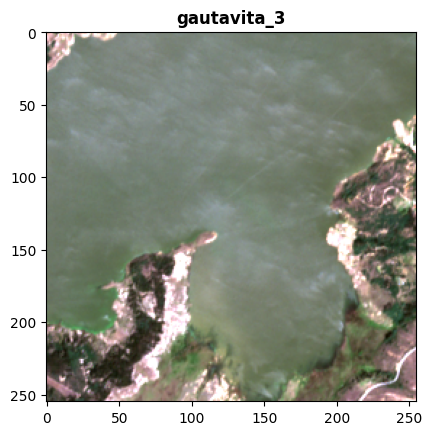

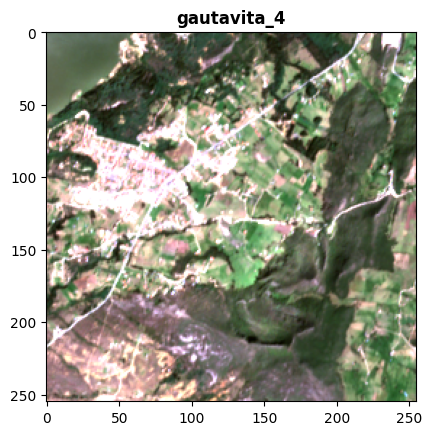

...

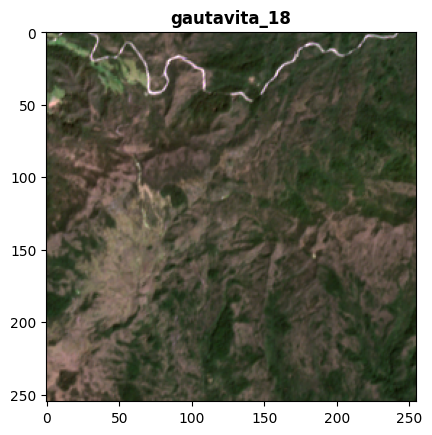

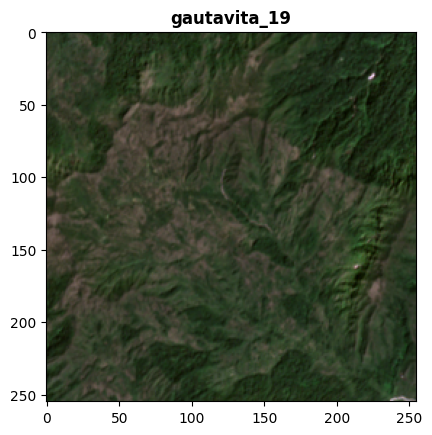

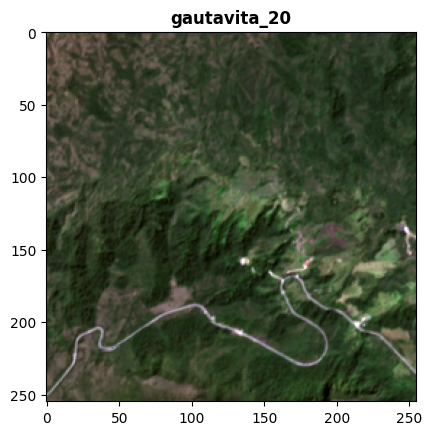

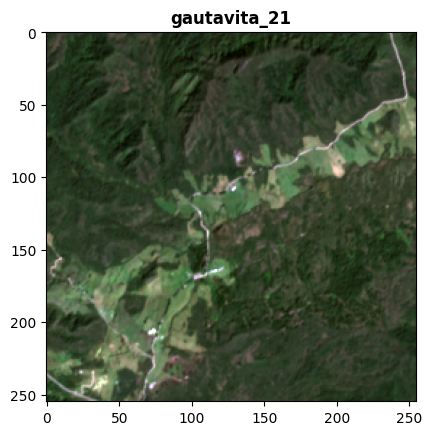

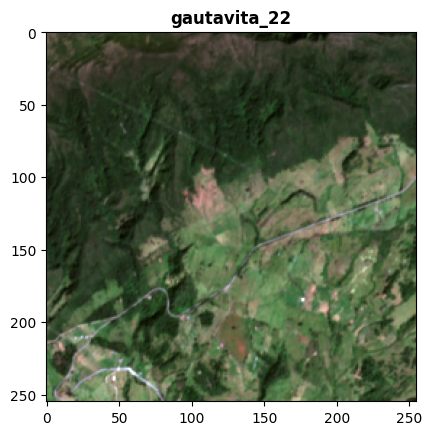

In [38]:
def generate_crop(image, shape, title='', output_dir=''):
  """Recorta una imagen según la forma del polígono y guarda el resultado en la carpeta especificada.
  Referencia: https://rasterio.readthedocs.io/en/latest/api/rasterio.mask.html#rasterio.mask.mask

  Args:
    image (str): Ruta del archivo de imagen (.tif)
    shape (geometry): El mosaico con el que recortar la imagen
    title(str): Titulo de la imagen
    output_dir (str): Carpeta donde guardar el recorte
  """

  os.makedirs(output_dir, exist_ok=True)
  with rio.open(image) as src:
      out_image, out_transform = mask.mask(src, shape, crop=True)
      # Recortar el borde negro (cero)
      _, x_nonzero, y_nonzero = np.nonzero(out_image)
      out_image = out_image[
        :,
        np.min(x_nonzero):np.max(x_nonzero),
        np.min(y_nonzero):np.max(y_nonzero)
      ]
      # Visualizar la imagen
      show(out_image, title=title)
      # Guardar el recorte
      out_meta = src.meta.copy()
      out_meta.update({
          "driver": "GTiff",
          "height": out_image.shape[1],
          "width": out_image.shape[2],
          "transform": out_transform
      })
      output_path = os.path.join(output_dir, f'{title}_crop.tif')
      with rio.open(output_path, "w", **out_meta) as dest:
          dest.write(out_image)

output_dir = '../tiles/Sentinel'
for i in range(len(tiles)):
    generate_crop(tif_file, [tiles.iloc[i]['geometry']], title=f'gautavita_{i}', output_dir=output_dir)

## Recorte de cobertura corine land cover